In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import adjusted_rand_score,adjusted_mutual_info_score


## Clustering results 100 smples

In [2]:
#Load the data
df_100=pd.read_csv('Results/Unsupervised_100_umap/clustering_100_clusters.csv')
df_100.rename(columns={'Unnamed: 0':'Sample'},inplace=True)
df_100.head()

,Sample,Cluster_rbf_2_0.125,Cluster_rbf_3_0.125,Cluster_rbf_4_0.125,Cluster_rbf_5_0.125,Cluster_rbf_6_0.125,Cluster_rbf_7_0.125,Cluster_rbf_8_0.125,Cluster_rbf_9_0.125,Cluster_rbf_10_0.125,...,Cluster_ZZ_linear_10_1,Cluster_ZZ_linear_2_2,Cluster_ZZ_linear_3_2,Cluster_ZZ_linear_4_2,Cluster_ZZ_linear_5_2,Cluster_ZZ_linear_6_2,Cluster_ZZ_linear_7_2,Cluster_ZZ_linear_8_2,Cluster_ZZ_linear_9_2,Cluster_ZZ_linear_10_2
0,1428,0,2,3,0,4,3,5,5,0,...,3,1,2,1,3,4,6,5,6,7
1,56,0,2,3,0,4,6,6,2,3,...,3,1,1,3,0,3,5,4,1,8
2,351,0,0,1,4,0,5,4,5,0,...,8,0,0,0,1,0,2,6,8,9
3,1681,0,0,0,3,3,4,2,4,6,...,3,0,0,0,1,5,3,0,7,6
4,1730,0,2,3,0,4,6,6,2,3,...,9,0,0,2,1,5,2,0,8,9


In [3]:
#Change some column names
for col in df_100.columns:
    if 'ZZ_linear' or 'ZZ_full' or 'Z_full'in col:
        df_100.rename(columns={col:col.replace('ZZ_linear','ZZlinear').replace('ZZ_full','ZZfull').replace('Z_full','Z')},inplace=True)

        


In [4]:
df_100.head()

,Sample,Cluster_rbf_2_0.125,Cluster_rbf_3_0.125,Cluster_rbf_4_0.125,Cluster_rbf_5_0.125,Cluster_rbf_6_0.125,Cluster_rbf_7_0.125,Cluster_rbf_8_0.125,Cluster_rbf_9_0.125,Cluster_rbf_10_0.125,...,Cluster_ZZlinear_10_1,Cluster_ZZlinear_2_2,Cluster_ZZlinear_3_2,Cluster_ZZlinear_4_2,Cluster_ZZlinear_5_2,Cluster_ZZlinear_6_2,Cluster_ZZlinear_7_2,Cluster_ZZlinear_8_2,Cluster_ZZlinear_9_2,Cluster_ZZlinear_10_2
0,1428,0,2,3,0,4,3,5,5,0,...,3,1,2,1,3,4,6,5,6,7
1,56,0,2,3,0,4,6,6,2,3,...,3,1,1,3,0,3,5,4,1,8
2,351,0,0,1,4,0,5,4,5,0,...,8,0,0,0,1,0,2,6,8,9
3,1681,0,0,0,3,3,4,2,4,6,...,3,0,0,0,1,5,3,0,7,6
4,1730,0,2,3,0,4,6,6,2,3,...,9,0,0,2,1,5,2,0,8,9


In [5]:
df_prova=df_100.copy()

In [6]:
df_prova=df_prova.T
#Set multinindex from index
df_prova.columns=df_prova.iloc[0]
df_prova.drop(df_prova.index[0],inplace=True)
df_prova.index=pd.MultiIndex.from_tuples([tuple(x.split('_')) for x in df_prova.index])
df_prova.index.names=['Method','Ft_map','K','Bandwidth']
df_prova.columns=df_prova.columns.astype(int)
df_prova.sort_index(inplace=True)
df_prova.head()

Sample                       1428  56    351   1681  1730  1793  464   414   \
Method  Ft_map K  Bandwidth                                                   
Cluster Z      10 0.125         2     3     7     2     3     2     9     1   
                  0.25          6     5     7     1     5     4     9     6   
                  0.5           5     3     5     4     3     4     8     5   
                  1             8     2     0     5     8     5     3     7   
                  2             0     9     4     2     5     1     7     8   

Sample                       1653  69    ...  1914  1830  968   1352  270   \
Method  Ft_map K  Bandwidth              ...                                 
Cluster Z      10 0.125         7     1  ...     1     9     6     8     8   
                  0.25          6     2  ...     2     9     3     0     1   
                  0.5           5     6  ...     6     2     1     0     9   
                  1             9     7  ...     7     9     1     0     9   
                  2             1     1  ...     8     0     6     7     9   

Sample                       289   1735  1036  366   220   
Method  Ft_map K  Bandwidth                                
Cluster Z      10 0.125         8     5     5     2     3  
                  0.25          8     2     0     4     6  
                  0.5           0     0     0     4     5  
                  1             0     0     0     0     8  
                  2             5     3     4     4     2  

[5 rows x 100 columns]

In [7]:
#access  the data
df=df_prova.droplevel(0,axis=0)
df.head()


Sample               1428  56    351   1681  1730  1793  464   414   1653  \
Ft_map K  Bandwidth                                                         
Z      10 0.125         2     3     7     2     3     2     9     1     7   
          0.25          6     5     7     1     5     4     9     6     6   
          0.5           5     3     5     4     3     4     8     5     5   
          1             8     2     0     5     8     5     3     7     9   
          2             0     9     4     2     5     1     7     8     1   

Sample               69    ...  1914  1830  968   1352  270   289   1735  \
Ft_map K  Bandwidth        ...                                             
Z      10 0.125         1  ...     1     9     6     8     8     8     5   
          0.25          2  ...     2     9     3     0     1     8     2   
          0.5           6  ...     6     2     1     0     9     0     0   
          1             7  ...     7     9     1     0     9     0     0   
          2             1  ...     8     0     6     7     9     5     3   

Sample               1036  366   220   
Ft_map K  Bandwidth                    
Z      10 0.125         5     2     3  
          0.25          0     4     6  
          0.5           0     4     5  
          1             0     0     8  
          2             4     4     2  

[5 rows x 100 columns]

In [20]:
df.drop_duplicates(inplace=True)

In [21]:
#for each K calculate ARI and AMI between the different methods
ari_df=pd.DataFrame(index=df.index,columns=df.index)
ami_df=pd.DataFrame(index=df.index,columns=df.index)
df.xs('10',level='K')
for i in df.index:
    for j in df.index:
        ari_df.loc[i,j]=adjusted_rand_score(df.loc[i],df.loc[j])
        ami_df.loc[i,j]=adjusted_mutual_info_score(df.loc[i],df.loc[j])



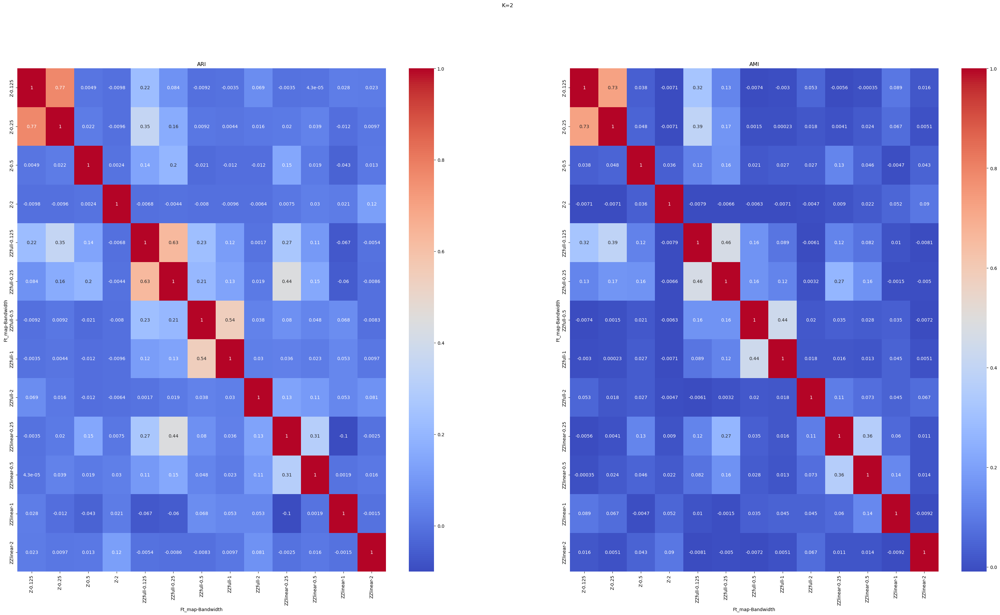

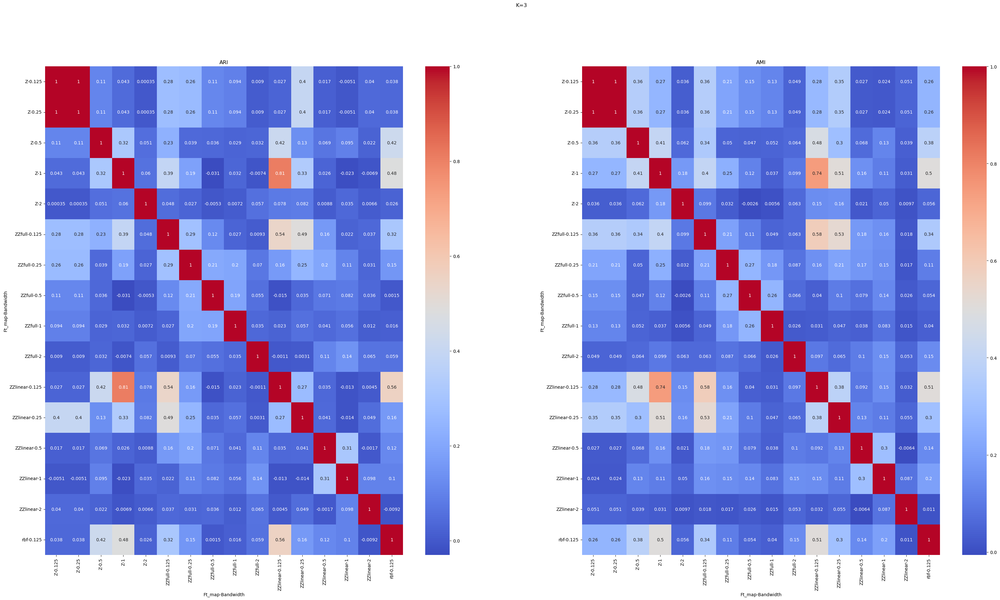

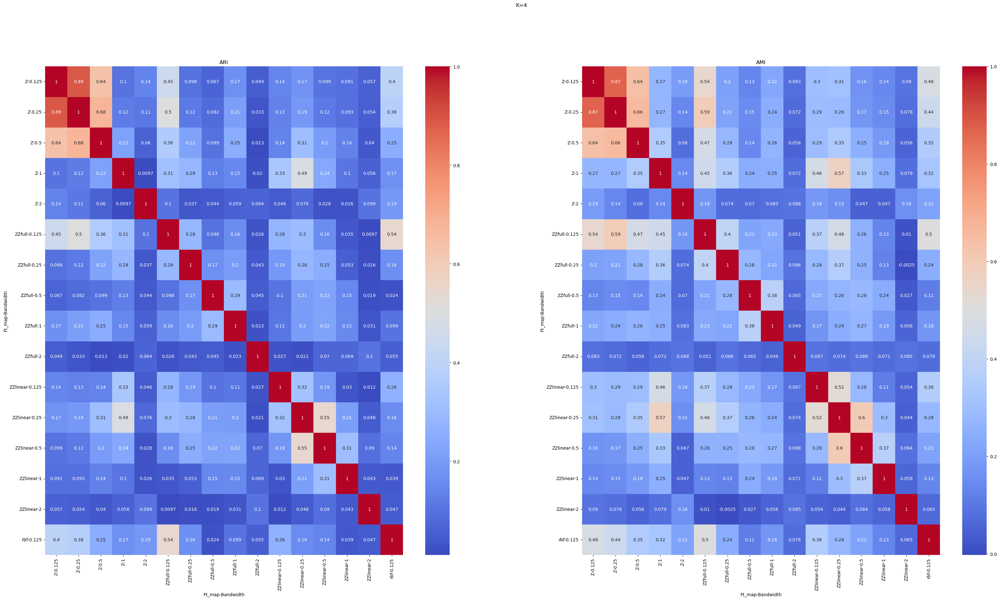

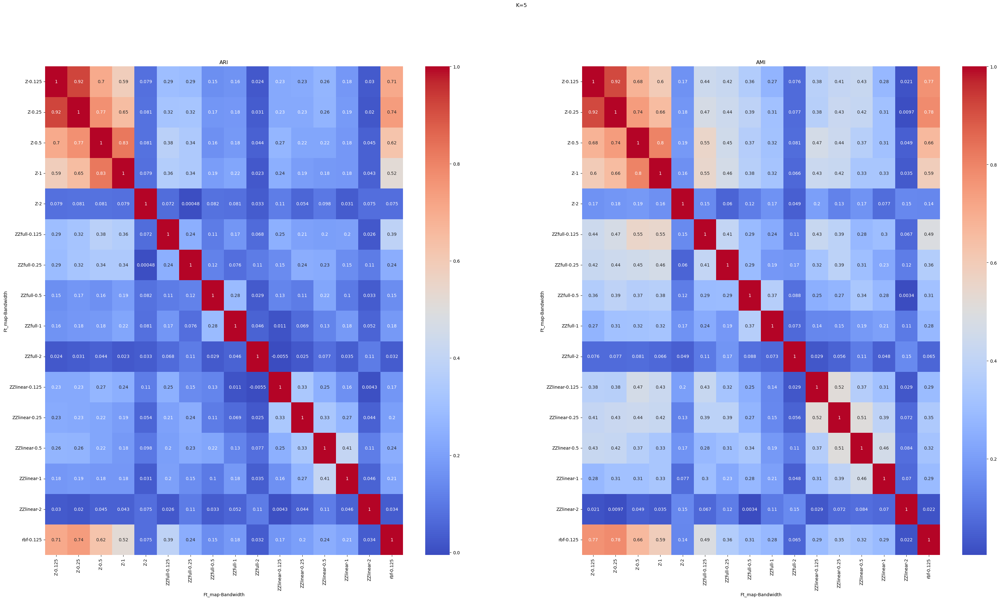

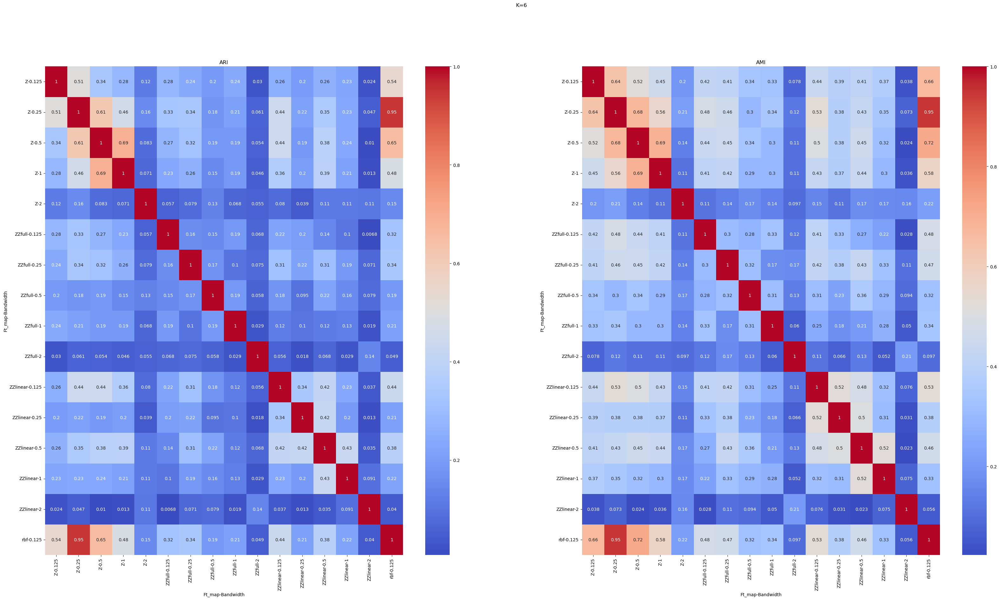

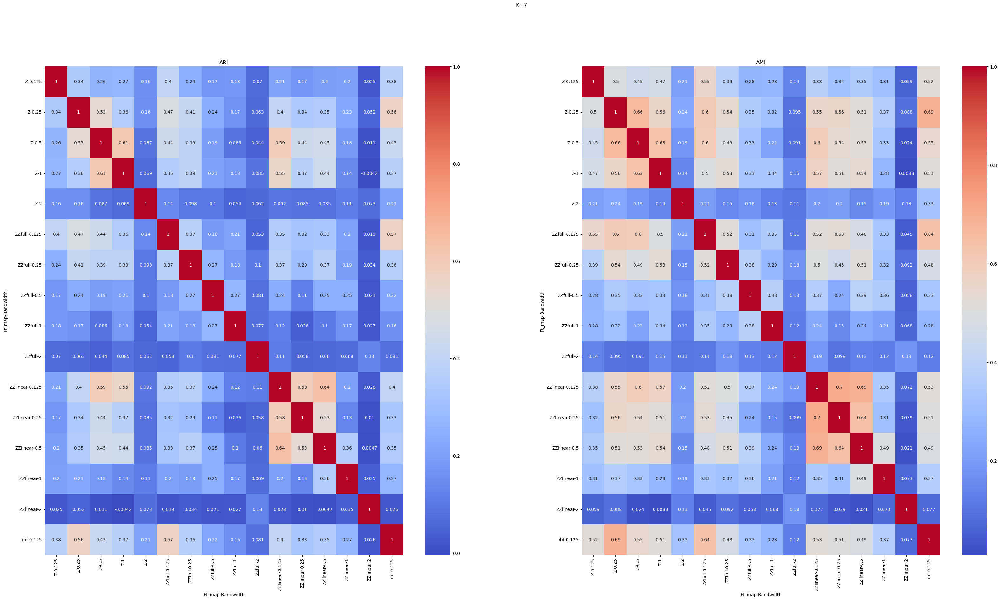

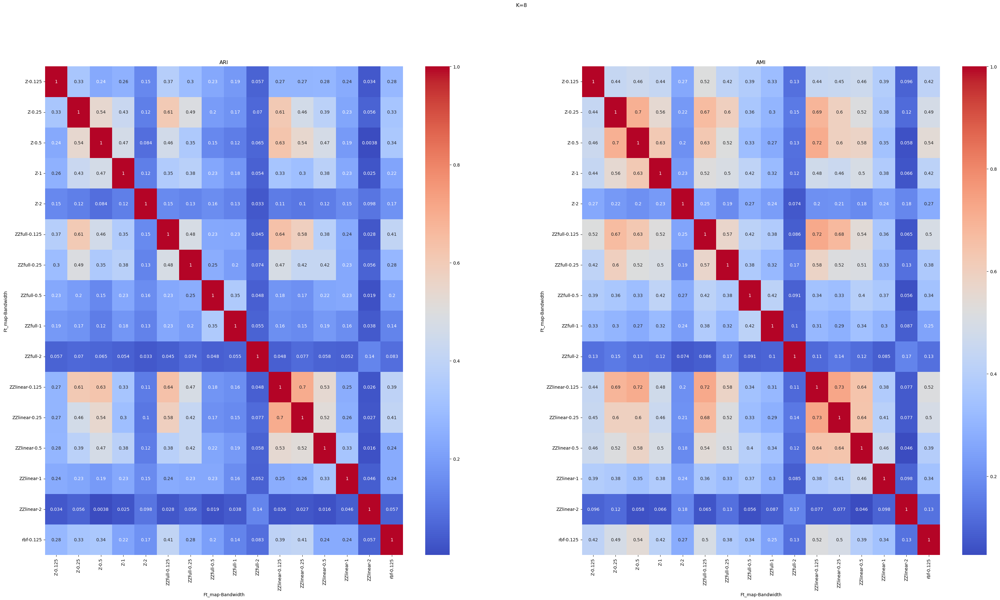

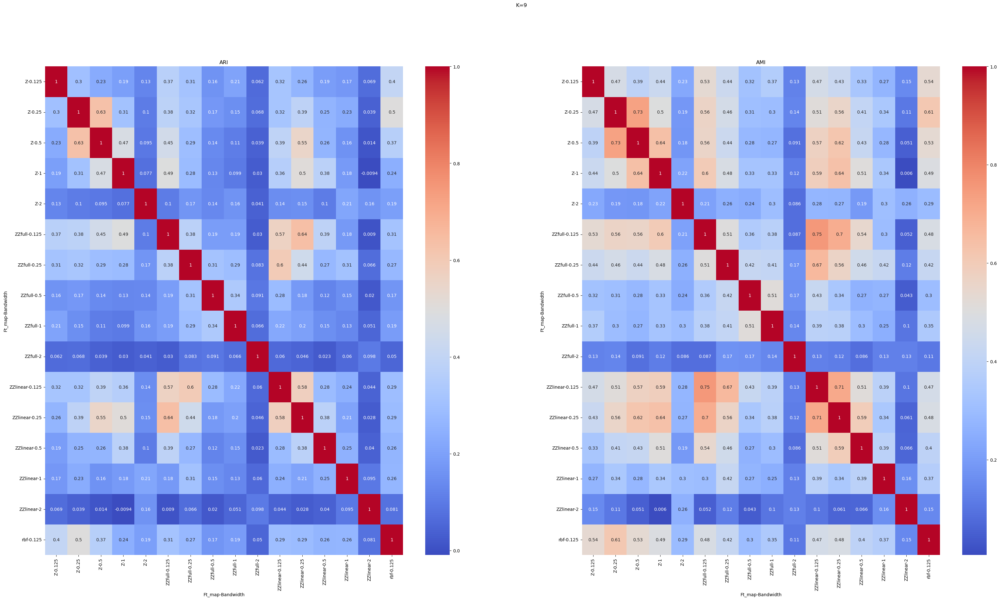

In [24]:
#plot the ARI and AMI as a heatmap for K=10, cmap='coolwarm'
K=range(2,10)
for k in K:
    fig,ax=plt.subplots(1,2,figsize=(40,20))
    sns.heatmap(ari_df.xs(str(k),level='K',axis=0).xs(str(k),level='K',axis=1).astype(float), annot=True, ax=ax[0], cmap='coolwarm')
    ax[0].set_title('ARI')
    sns.heatmap(ami_df.xs(str(k),level='K',axis=0).xs(str(k),level='K',axis=1).astype(float), annot=True, ax=ax[1], cmap='coolwarm')
    ax[1].set_title('AMI') 
    plt.suptitle('K='+str(k))

## Clustering results 1000 smples

In [30]:
#Load data
df_1000=pd.read_csv('Results/Unsupervised_1000_umap/clustering_1000_clusters.csv')
df_1000.rename(columns={'Unnamed: 0':'Sample'},inplace=True)
# Correct some column names
for col in df_1000.columns:
    if 'ZZ_linear' or 'ZZ_full' or 'Z_full'in col:
        df_1000.rename(columns={col:col.replace('ZZ_linear','ZZlinear').replace('ZZ_full','ZZfull').replace('Z_full','Z')},inplace=True)



In [31]:
#Transpose and Set multinindex from index
df_1000=df_1000.T
df_1000.columns=df_1000.iloc[0]
df_1000.drop(df_1000.index[0],inplace=True)
df_1000.index=pd.MultiIndex.from_tuples([tuple(x.split('_')) for x in df_1000.index])
df_1000.index.names=['Method','Ft_map','K','Bandwidth']
#drop Method level
df_1000=df_1000.droplevel(0,axis=0)
print(df_1000.head())
#drop duplicates
df_1000.drop_duplicates(inplace=True)

Sample              1428  56    351   1681  1730  1793  464   414   1653  \
Ft_map K Bandwidth                                                         
rbf    2 0.125         1     1     0     0     1     0     0     1     0   
       3 0.125         2     2     0     0     2     0     0     2     0   
       4 0.125         2     2     0     0     2     0     3     0     3   
       5 0.125         3     3     0     0     3     0     2     0     0   
       6 0.125         0     0     5     3     0     4     2     3     3   

Sample              69    ...  228   39    542   242   898   1121  136   1179  \
Ft_map K Bandwidth        ...                                                   
rbf    2 0.125         1  ...     0     0     1     0     0     0     0     1   
       3 0.125         2  ...     0     0     2     0     0     0     0     2   
       4 0.125         0  ...     0     3     2     0     0     0     3     2   
       5 0.125         0  ...     4     2     3     4     0   

In [37]:
#Calculate ARI and AMI 
ari_df_1000=pd.DataFrame(index=df_1000.index,columns=df_1000.index)
ami_df_1000=pd.DataFrame(index=df_1000.index,columns=df_1000.index)
#df_1000.xs('10',level='K')
for i in df_1000.index:
    for j in df_1000.index:
        ari_df_1000.loc[i,j]=adjusted_rand_score(df_1000.loc[i],df_1000.loc[j])
        ami_df_1000.loc[i,j]=adjusted_mutual_info_score(df_1000.loc[i],df_1000.loc[j])



/tmp/ipykernel_1860605/3615458966.py:7: PerformanceWarning: indexing past lexsort depth may impact performance.
  ari_df_1000.loc[i,j]=adjusted_rand_score(df_1000.loc[i],df_1000.loc[j])
/tmp/ipykernel_1860605/3615458966.py:8: PerformanceWarning: indexing past lexsort depth may impact performance.
  ami_df_1000.loc[i,j]=adjusted_mutual_info_score(df_1000.loc[i],df_1000.loc[j])
/tmp/ipykernel_1860605/3615458966.py:7: PerformanceWarning: indexing past lexsort depth may impact performance.
  ari_df_1000.loc[i,j]=adjusted_rand_score(df_1000.loc[i],df_1000.loc[j])
/tmp/ipykernel_1860605/3615458966.py:8: PerformanceWarning: indexing past lexsort depth may impact performance.
  ami_df_1000.loc[i,j]=adjusted_mutual_info_score(df_1000.loc[i],df_1000.loc[j])
/tmp/ipykernel_1860605/3615458966.py:7: PerformanceWarning: indexing past lexsort depth may impact performance.
  ari_df_1000.loc[i,j]=adjusted_rand_score(df_1000.loc[i],df_1000.loc[j])
/tmp/ipykernel_1860605/3615458966.py:8: PerformanceWarni

In [38]:
#order the index as the previous dataframe
ari_df_1000=ari_df_1000.reindex(index=ari_df.index,columns=ari_df.columns)
ami_df_1000=ami_df_1000.reindex(index=ami_df.index,columns=ami_df.columns)


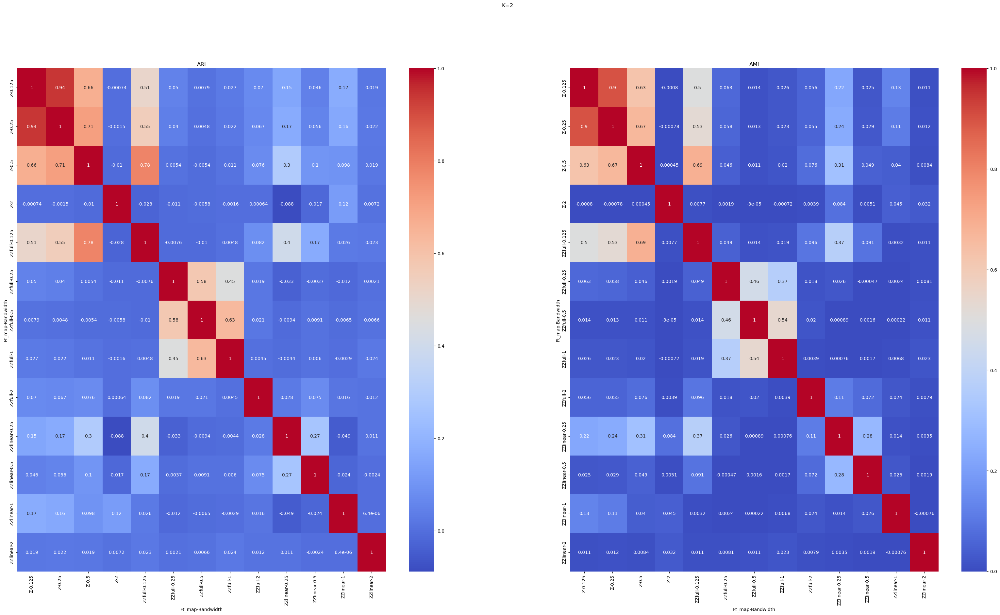

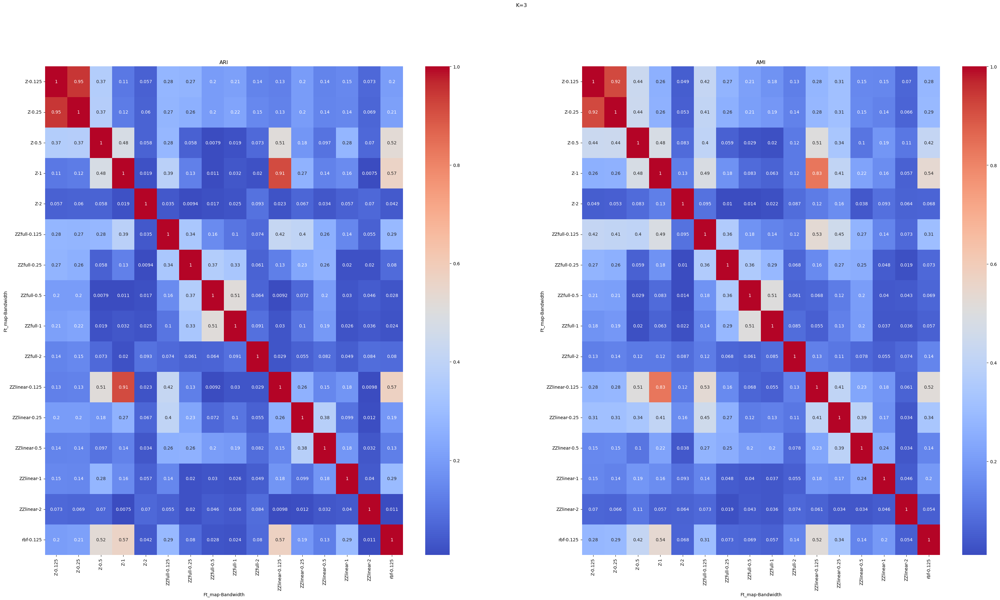

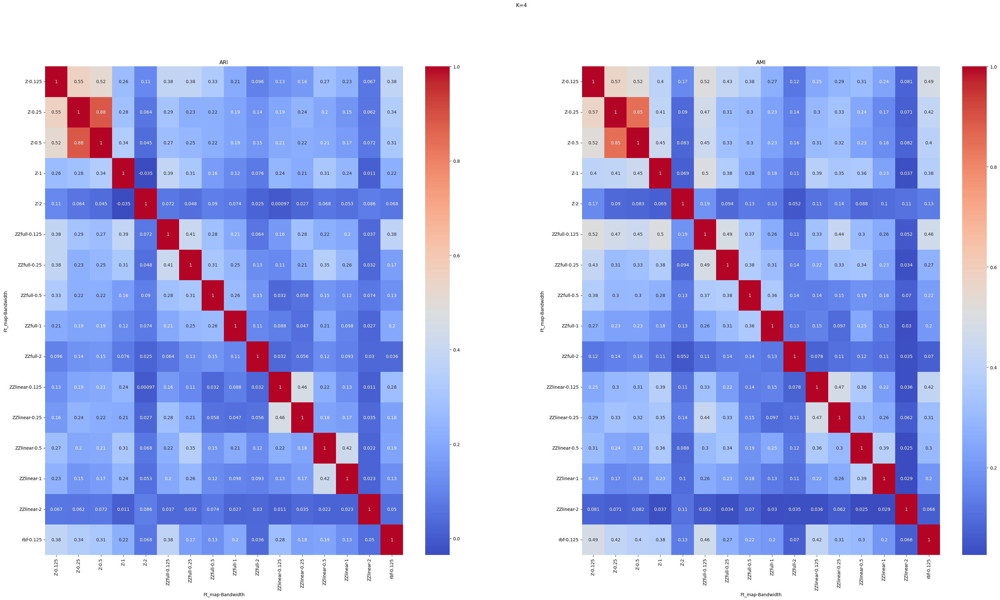

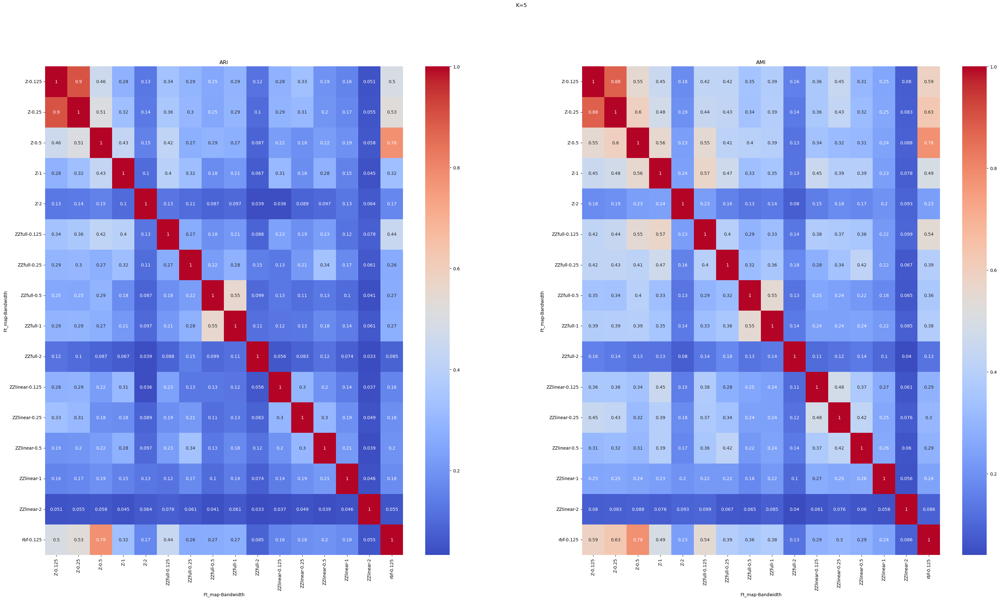

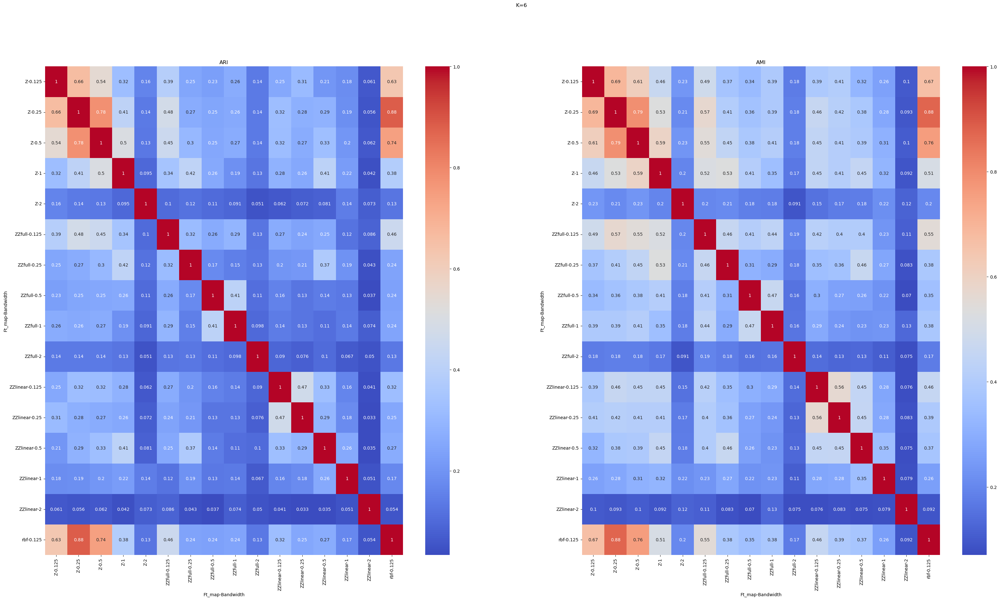

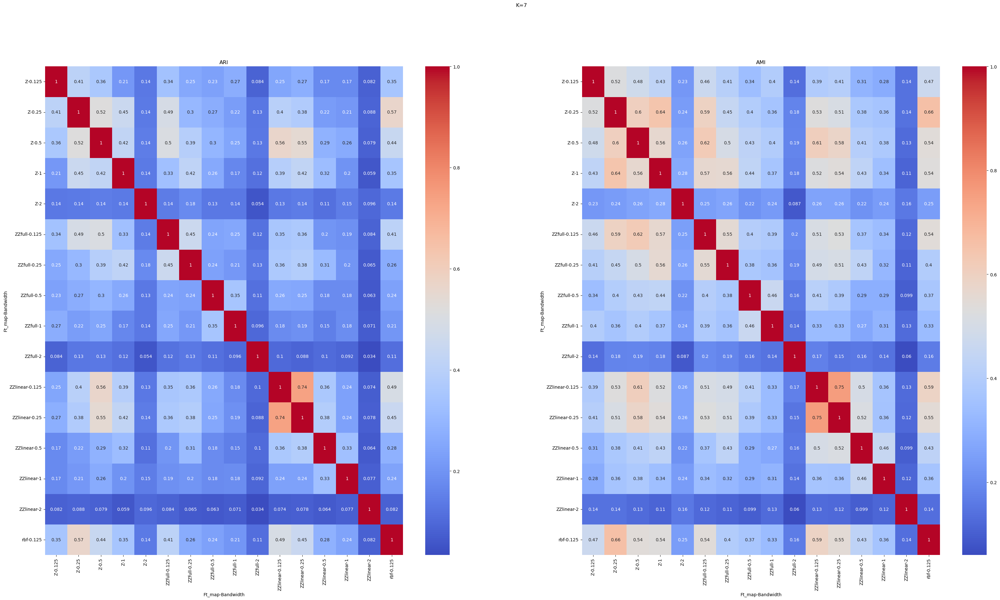

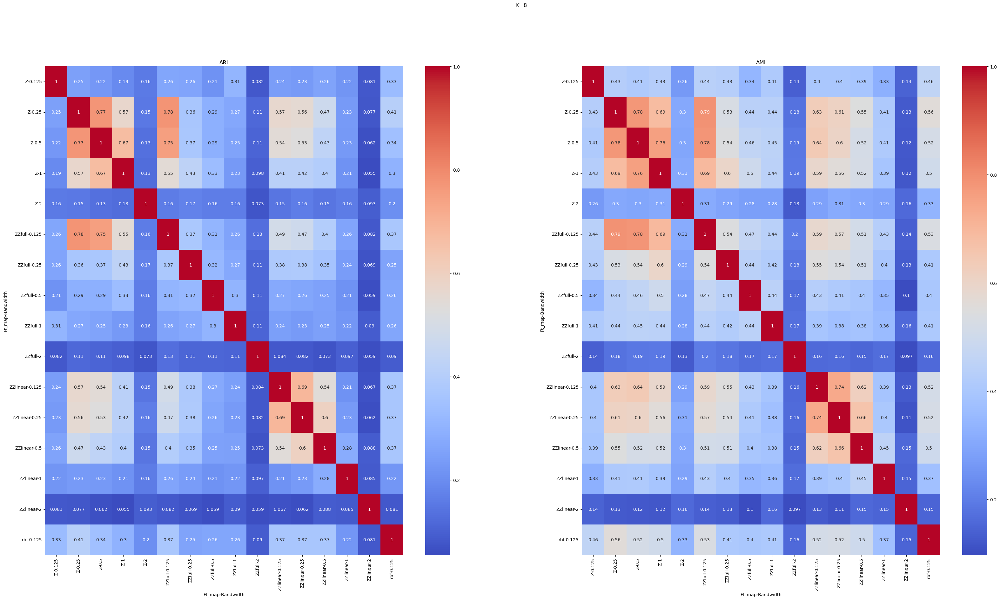

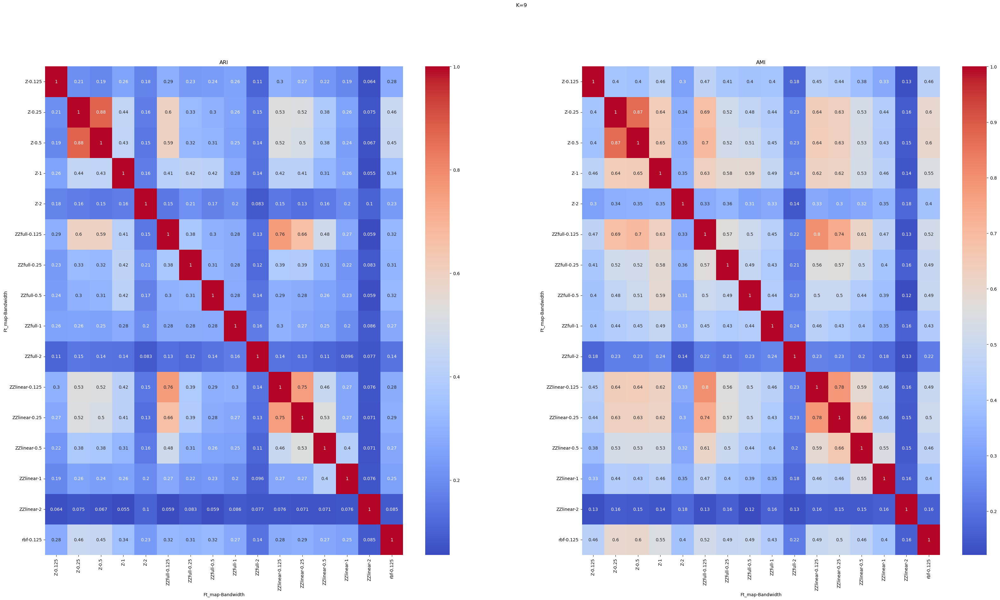

In [39]:
#Plot the ARI and AMI as a heatmap for each K, cmap='coolwarm'
K=range(2,10)
for k in K:
    fig,ax=plt.subplots(1,2,figsize=(40,20))
    sns.heatmap(ari_df_1000.xs(str(k),level='K',axis=0).xs(str(k),level='K',axis=1).astype(float), annot=True, ax=ax[0], cmap='coolwarm')
    ax[0].set_title('ARI')
    sns.heatmap(ami_df_1000.xs(str(k),level='K',axis=0).xs(str(k),level='K',axis=1).astype(float), annot=True, ax=ax[1], cmap='coolwarm')
    ax[1].set_title('AMI') 
    plt.suptitle('K='+str(k))

# Quantum vs Simulated